## Layer Diffuse + Style Aligned

In [1]:
from layerdiffuse.inference import load_models, dtype_from_str
from pathlib import Path
import torch 
from refiners.fluxion.utils import (
    manual_seed,
    no_grad,
    images_to_tensor,
    tensor_to_images
)
from utils.inverse import inverse_ddim, inversion_callback
from PIL import Image
from tqdm import tqdm
from refiners.foundationals.latent_diffusion.style_aligned import StyleAlignedAdapter
import numpy as np


In [2]:
save_path = Path("/home/chloedaems0/layerdiffuse/outputs/")
save_path.mkdir(parents=True, exist_ok=True)
checkpoint_path = Path("/home/chloedaems0/layerdiffuse/checkpoints/")
device = torch.device("cuda")
dtype = dtype_from_str("bfloat16")
sdxl, transparent_decoder = load_models(checkpoint_path, device=device, dtype=dtype)
manual_seed(seed=1234)

In [3]:
src_style = "simple drawing"
src_prompt = f'Man working on a laptop, {src_style}.'
image_path = Path('../ref_image.png')
num_inference_steps = 50

ref_image = Image.open(image_path)
np_ref_image = np.array(ref_image.resize((1024, 1024)))

In [13]:
ref_latents = inverse_ddim(sdxl, src_prompt, image_path, 2)
latents_imgs = tensor_to_images(tensor=ref_latents)

100%|██████████| 30/30 [03:07<00:00,  6.24s/it]


In [9]:
ref = sdxl.lda.decode_latents(ref_latents[0].unsqueeze(0))

In [12]:
len(sdxl.solver.cumulative_scale_factors)

1000

In [7]:
#Add Style Align
style_aligned_adapter = StyleAlignedAdapter(sdxl.unet)
style_aligned_adapter.inject()
print("ok")

ok


In [8]:
set_of_prompts = [
    src_prompt,
    f"A man working on a laptop, {src_style}",
    f"A man eating a pizza, {src_style}",
    f"A woman writing on a paper, {src_style}",
]
offset = 0

100%|██████████| 30/30 [01:09<00:00,  2.33s/it]


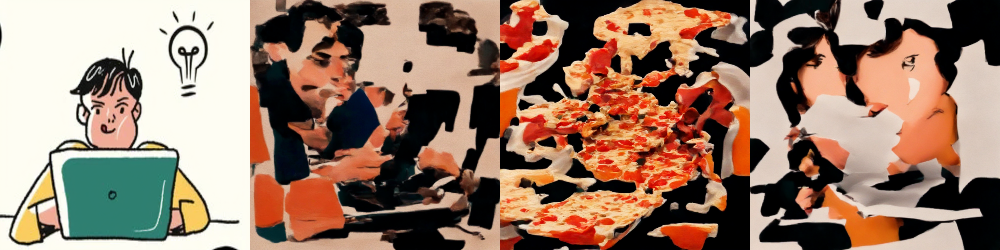

In [9]:
with no_grad():
        # clip_text_embedding, pooled_text_embedding = sdxl.compute_clip_text_embedding(
        #     text=prompt + ", best quality, high quality",
        #     negative_text="monochrome, lowres, bad anatomy, worst quality, low quality",
        # )
        clip_text_embedding, pooled_text_embedding = sdxl.compute_clip_text_embedding(
        text=set_of_prompts, negative_text=["monochrome, lowres, bad anatomy, worst quality, low quality, background"] * len(set_of_prompts)
    )
        #time_ids = sdxl.default_time_ids
        time_ids = sdxl.default_time_ids.repeat(len(set_of_prompts), 1)

        #x = sdxl.init_latents((1024, 1024)).to(device=device, dtype=dtype)
        x = torch.randn(
        (len(set_of_prompts), 4, 128, 128),
        device=sdxl.device,
        dtype=sdxl.dtype,
        )
        x[0] = ref_latents[offset]
        for step in tqdm(sdxl.steps):
            x = sdxl(
                x,
                step=step,
                clip_text_embedding=clip_text_embedding,
                pooled_text_embedding=pooled_text_embedding,
                time_ids=time_ids,
            )
            x= inversion_callback(x, ref_latents, step, offset = offset)
        #latent = x
        #pixel = sdxl.lda.decode_latents(x)
        predicted_images = [sdxl.lda.decode_latents(latent.unsqueeze(0)) for latent in x]
        # tile all images horizontally
        merged_image = Image.new("RGB", (1024 * len(predicted_images), 1024))
        for i in range(len(predicted_images)): # type: ignore
            merged_image.paste(predicted_images[i], (i * 1024, 0))
        
merged_image

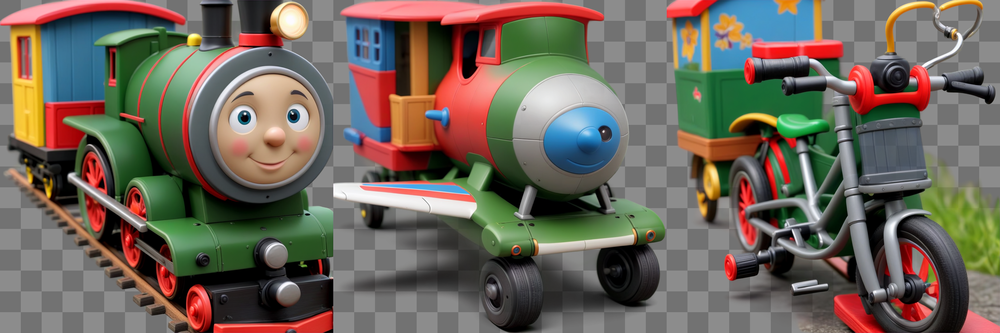

In [21]:
with no_grad():
    pixels = images_to_tensor(predicted_images, dtype=dtype, device=device)
    transparent_images, transparent_images_png = transparent_decoder.run(pixels, x)

merged_image = Image.new("RGB", (1024 * len(predicted_images), 1024))
transparent_images = tensor_to_images(transparent_images)

for i in range(len(transparent_images)): # type: ignore
    merged_image.paste(transparent_images[i], (i * 1024, 0))# type:ignore

merged_image